### Considered model: four-bar linkage (= two link manipulator + one link manipulator + rigid coupling)


This Notebook depends on symbtools >=0.2.5

→ `pip install --upgrade symbtools`





In [1]:
%load_ext ipydex.displaytools
%matplotlib inline

import sys
# to load assimulo under wsl2
sys.path.append('/home/kwrede/miniconda3/lib/python3.8/site-packages')
sys.path.append('/home/wredi/miniconda3/lib/python3.8/site-packages')

import os
import pickle

import sympy as sp
import numpy as npy  # we need `np` later 
from sympy import sin, cos, pi
from sympy.interactive import printing

# using wredsen's symbtools fork (https://github.com/wredsen/symbtools @ DAE_statefeedback), assuming repos SA-Wrede and symbtools share the same parent directory
sys.path.append('../../symbtools/')
import symbtools as st
import symbtools.modeltools as mt
from symbtools.modeltools import Rz # Rotationsmatrix in the xy plane (c, -s; s, c)

import scipy as sc
import scipy.integrate as sc_integrate
from scipy.optimize import fmin
import matplotlib.pyplot as pl
from assimulo.solvers import ODASSL as SOLVER # Imports the solver ODASSL from Assimulo
from assimulo.problem import Overdetermined_Problem # Imports the problem formulation from Assimulo
import ipydex
plt = pl

printing.init_printing(1)

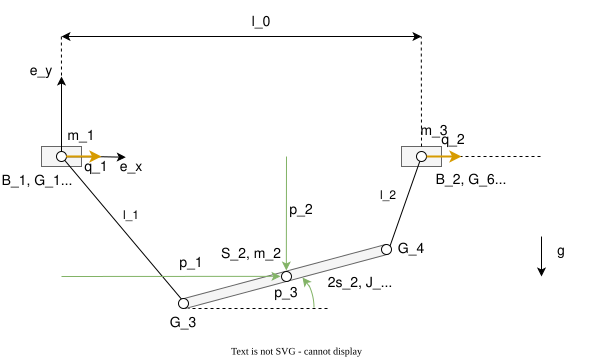

In [2]:
from IPython.display import Image
from IPython.core.display import SVG
SVG(filename='ODE_flatness_analysis_simulation_diagram.svg')

In [3]:
t = sp.Symbol('t')  # time variable

# coordinates
np = 3 # number of passive coordinates (not directly actuated)
nq = 2 # number of actuated coordinates
n = np + nq

pp = st.symb_vector("p1:{0}".format(np+1)) # vector of passive coordinates
qq = st.symb_vector("q1:{0}".format(nq+1)) # vector of actuated coordinates



# vector of control inputs
aa = st.symb_vector("a1:{0}".format(4+1)) ##:T
# vector of all coordinates
ttheta = st.row_stack(pp, qq) ##:T
# vector of velocities 
tthetad = st.time_deriv(ttheta, ttheta) ##:T
# vector of accelerations
tthetadd = st.time_deriv(ttheta, ttheta, order=2) ##:T
tthetaddd = st.time_deriv(ttheta, ttheta, order=3) ##:T
tthetadddd = st.time_deriv(ttheta, ttheta, order=4) ##:T

st.make_global(ttheta, tthetad, tthetadd, tthetaddd, tthetadddd)

# define symbols for measured states
p_meas = st.symb_vector("pm1:{0}".format(3+1)) # error vector of passive coordinates
q_meas = st.symb_vector("qm1:{0}".format(2+1)) # error vector of actuated coordinates

meas_states = st.row_stack(p_meas, q_meas) ##:T
meas_states_d = st.time_deriv(meas_states, meas_states) ##:T

st.make_global(meas_states, meas_states_d)

# define symbols for reference trajectory states
p_ref = st.symb_vector("pr1:{0}".format(3+1)) # error vector of passive coordinates
q_ref = st.symb_vector("qr1:{0}".format(2+1)) # error vector of actuated coordinates

ref_states = st.row_stack(p_ref, q_ref)
ref_states_d = st.time_deriv(ref_states, ref_states)
ref_states_dd = st.time_deriv(ref_states, ref_states, order=2)
ref_states_ddd = st.time_deriv(ref_states, ref_states, order=3)
ref_states_dddd = st.time_deriv(ref_states, ref_states, order=4)

st.make_global(ref_states, ref_states_d, ref_states_dd, ref_states_ddd, ref_states_dddd)

aalpha = sp.symbols('alpha1, alpha3, alpha4') # vector of 1 times integrated original inputs
bbeta = sp.symbols('beta1, beta3, beta4') # vector of 2 times integrated original inputs

st.make_global(aalpha, bbeta)

QQ = st.symb_vector("Q1:{0}".format(n+1)) ##:T # vector of generalized foces
st.make_global(QQ)

---

---

---

---

---

---

---

---

---

In [4]:
# symbols for analytic equations
params = sp.symbols('s2, m1, m2, m3, J1, J2, J3, mc1b, mc2b d1, d4, l0, l1, l2, l3, g')
st.make_global(params)

# symbols for control inputs
# ttau = sp.symbols('tau')
tau1, tau2, tau3, tau4 = ttau = st.symb_vector("tau1, tau2, tau3, tau4")

Specify the geometry (joints G and centers of masses S)

---

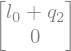

---

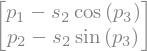

---

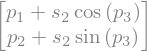

---

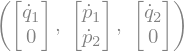

---

In [5]:
# unit vectors
ex = sp.Matrix([1, 0])
ey = sp.Matrix([0, 1])

# basis 1 and 2 (cart positions)
S1 = G1 = B1 = sp.Matrix([q1, 0]) ##:
S3 = G6 = B2 = sp.Matrix([l0 + q2, 0]) ##:

# center of gravity of load
S2 = sp.Matrix([p1, p2])

# suspension points of load
G3 = S2 - Rz(p3)*ex*s2 ##:
G4 = S2 + Rz(p3)*ex*s2 ##:

# Time derivatives of centers of masses
Sd1, Sd2, Sd3 = st.col_split(st.time_deriv(st.col_stack(S1, S2, S3), ttheta)) ##:

# rope vectors
rope1 = (G3 - S1)
rope2 = (G4 - S3)

# Initial values

In [6]:
# load model etc. from pickle of flatness analysis notebook
with open("flatness_analysis_control.pcl", "rb") as pfile:
    data = pickle.load(pfile)
    locals().update(data)

In [7]:
# load model etc. from pickle of flatness analysis notebook
with open("qstat_expr.pcl", "rb") as pfile:
    data = pickle.load(pfile)
    locals().update(data)

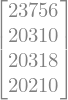

In [8]:
dyn_tau.co

In [9]:
sys_params = list(dict(J2=0.004553475, g=9.81, l0=0.3, m1=0.45, m2=0.557, m3=0.45, s2=0.15).items()) ##:

sys_params := [('J2', 0.004553475),
 ('g', 9.81),
 ('l0', 0.3),
 ('m1', 0.45),
 ('m2', 0.557),
 ('m3', 0.45),
 ('s2', 0.15)]

---

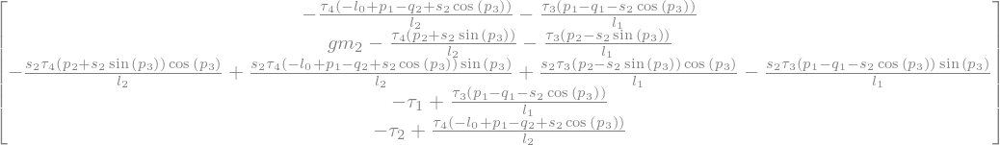

In [10]:
eqns.subz0(tthetadd)

---

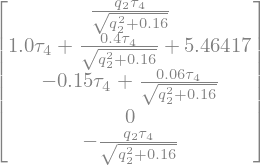

---

In [11]:
# determine a symetrical equilibrium:
# TODO: woher Wahl von ttau?
eqlbr_conditions = [(q1, 0), (p1, 0.15), (p2, -0.4), (p3, 0), (tau1, 0), (tau2, 0), (tau3, tau4)] ##:

res = ((mod.eqns.subz0(tthetadd)).subs(eqlbr_conditions)).subs(sys_params) ##:

In [12]:
symbs = list(res.s) ##:
sol = sp.solve(res, symbs, dict=True) ##:

---

---

In [13]:
ttheta0 = st.to_np(ttheta.subs(eqlbr_conditions).subs(sol[0])).squeeze() ##:

uu0 = st.to_np(ttau.subs(eqlbr_conditions).subs(sol[0])).squeeze()##:

ttheta0 := array([ 0.15, -0.4 ,  0.  ,  0.  ,  0.  ])

---

uu0 := array([ 0.      ,  0.      , -2.732085, -2.732085])

---

# Trajectory planning
The parametrization of $\tau_2$ determines the highest required order $N_i$ of the flat output's derivatives. For each component of the flat output a trajectory $y_i$ can be chosen with a polynomial order of $\alpha_i = 2 N_i + 1$ in compliance with the system's initial values.

---

---

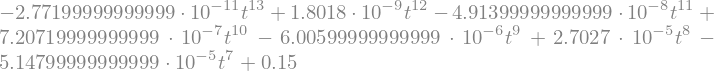

---

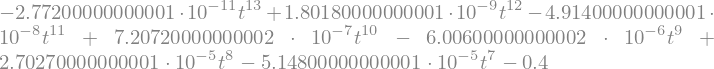

---

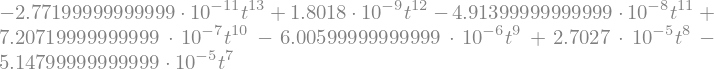

---

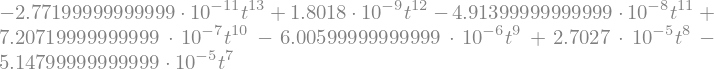

---

In [14]:
T0, T1 = 0, 10
p10, p20, p30, q10 = ttheta0[:-1] ##:
p1e, p2e, p3e, q1e = ttheta0[:-1] - 0.3 ##:
# p10 = p10 + 0.2
# p20 = p20 + 0.15
# q10 = q10 + 0.15
# p30 = p30 + 0.1
# polynoms of order 13 = 9 (boundary conditions until 4th derivative due to usage of qddot2 later) 
# + 4 (2 more derivatives needed for tauddot as new control input) for p_i
p1_traj = st.condition_poly(t, (T0, p10, 0, 0, 0, 0, 0, 0), (T1, p1e, 0, 0, 0, 0, 0, 0)) ##:
p2_traj = st.condition_poly(t, (T0, p20, 0, 0, 0, 0, 0, 0), (T1, p2e, 0, 0, 0, 0, 0, 0)) ##:
p3_traj = st.condition_poly(t, (T0, p30, 0, 0, 0, 0, 0, 0), (T1, p3e, 0, 0, 0, 0, 0, 0)) ##:
# polynoms of order 13 = 9 (boundary conditions until 4th derivative due to usage of qddot2 later) 
# + 4 (2 more derivatives needed for tauddot as new control input) for q1
q1_traj = st.condition_poly(t, (T0, q10, 0, 0, 0, 0, 0, 0), (T1, q1e, 0, 0, 0, 0, 0, 0)) ##:
# trajectory for q2 from flatness relations 
q2_traj = flat_q2.subz([p1, p2, p3, pddot1, pddot2, pddot3, q1], [p1_traj, p2_traj, p3_traj, p1_traj.diff(t, 2), p2_traj.diff(t, 2), p3_traj.diff(t, 2), q1_traj])
q2_traj = q2_traj.subs(sys_params)

Substitution of $\mathbf{y}$ with trajectories into control inputs

In [15]:
flat_tau2.s

In [16]:
%%time

flat_quant_subs = [p1_traj, p2_traj, p3_traj, q1_traj, q2_traj,
                   p1_traj.diff(t), p2_traj.diff(t), p3_traj.diff(t), q1_traj.diff(t), q2_traj.diff(t),
                   p1_traj.diff(t, 2), p2_traj.diff(t, 2), p3_traj.diff(t, 2), q1_traj.diff(t, 2), q2_traj.diff(t, 2),
                   p1_traj.diff(t, 3), p2_traj.diff(t, 3), p3_traj.diff(t, 3), q1_traj.diff(t, 3), q2_traj.diff(t, 3),
                   p1_traj.diff(t, 4), p2_traj.diff(t, 4), p3_traj.diff(t, 4), q1_traj.diff(t, 4), q2_traj.diff(t, 4)]
flat_quant_func = st.expr_to_func(t, flat_quant_subs)

CPU times: user 3min 57s, sys: 224 ms, total: 3min 57s
Wall time: 3min 57s


In [17]:
tau1_traj = dyn_tau[0]
tau2_traj = dyn_tau[1]
tau3_traj = dyn_tau[2]
tau4_traj = dyn_tau[3]

In [18]:
tau1_traj_num = tau1_traj.subs(sys_params)
tau2_traj_num = tau2_traj.subs(sys_params)
tau3_traj_num = tau3_traj.subs(sys_params)
tau4_traj_num = tau4_traj.subs(sys_params)

In [19]:
tau1_traj_func = st.expr_to_func([*meas_states, *meas_states_d, tau1, tau3, tau4, *aalpha, *ref_states, *ref_states_d, *ref_states_dd, *ref_states_ddd, *ref_states_dddd], tau1_traj_num)
tau2_traj_func = st.expr_to_func([*meas_states, *meas_states_d, tau1, tau3, tau4, *aalpha, *ref_states, *ref_states_d, *ref_states_dd, *ref_states_ddd, *ref_states_dddd], tau2_traj_num)
tau3_traj_func = st.expr_to_func([*meas_states, *meas_states_d, tau1, tau3, tau4, *aalpha, *ref_states, *ref_states_d, *ref_states_dd, *ref_states_ddd, *ref_states_dddd], tau3_traj_num)
tau4_traj_func = st.expr_to_func([*meas_states, *meas_states_d, tau1, tau3, tau4, *aalpha, *ref_states, *ref_states_d, *ref_states_dd, *ref_states_ddd, *ref_states_dddd], tau4_traj_num)

In [20]:
# seperate trajectory callable functions
p1_traj_func = st.expr_to_func(t, p1_traj)
p2_traj_func = st.expr_to_func(t, p2_traj)
p3_traj_func = st.expr_to_func(t, p3_traj)
q1_traj_func = st.expr_to_func(t, q1_traj)
q2_traj_func = st.expr_to_func(t, q2_traj)

# Simulation model

In [21]:
xx_dyn ##T:

---

In [22]:
sim = st.SimulationModel(f_dyn, g_dyn, xx_dyn, model_parameters=sys_params)

In [23]:
# control forces for stabilizing equilbrium
uu1 = npy.array([0, 0, 0, 0]) # as new control inputs contain derivatives of original tau -> 0 in equilibrium
def composite_force(x, t):
    # friction constants
    di = 10
    dissipation1 = -di*x[8]
    dissipation2 = -di*x[9]
    control_force = 0
    
    forces = uu1 #+ [dissipation1, dissipation2, 0.0, 0.0]
    return forces

# control forces for driving feed forward trajectories
def feed_forward_traj(x, t):
    #if t < 1e-2:
    #    forces = uu1        
    if t < 9.99:
        u1 = tau1_traj_func(*x, *flat_quant_func(t))
        u2 = tau2_traj_func(*x, *flat_quant_func(t))
        u3 = tau3_traj_func(*x, *flat_quant_func(t))
        u4 = tau4_traj_func(*x, *flat_quant_func(t))
        
        forces = [u1, u2, u3, u4]
    else:
        u1 = tau1_traj_func(*x, *flat_quant_func(9.99))
        u2 = tau2_traj_func(*x, *flat_quant_func(9.99))
        u3 = tau3_traj_func(*x, *flat_quant_func(9.99))
        u4 = tau4_traj_func(*x, *flat_quant_func(9.99))
        forces = [u1, u2, u3, u4]
    return forces

In [24]:
rhs = sim.create_simfunction(controller_function=feed_forward_traj)

<lambdifygenerated-28>:2: RuntimeWarning: invalid value encountered in double_scalars
  return (-qrddddot2 + qrddddot2 - qr2 + qr2 - qrddot2 + qrddot2 - qrdot2 + qrdot2 - qrdddot2 + qrdddot2 + (-1947.04872890281*(-tau4/sqrt((pm2 + 0.15*sin(pm3))**2 + (pm1 - qm2 + 0.15*cos(pm3) - 0.3)**2) + tau4*(pm1 - qm2 + 0.15*cos(pm3) - 0.3)**2/((pm2 + 0.15*sin(pm3))**2 + (pm1 - qm2 + 0.15*cos(pm3) - 0.3)**2)**(3/2))*(0.15*(pm2 + 0.15*sin(pm3))*cos(pm3)/sqrt((pm2 + 0.15*sin(pm3))**2 + (pm1 - qm2 + 0.15*cos(pm3) - 0.3)**2) - 0.15*(pm1 - qm2 + 0.15*cos(pm3) - 0.3)*sin(pm3)/sqrt((pm2 + 0.15*sin(pm3))**2 + (pm1 - qm2 + 0.15*cos(pm3) - 0.3)**2))*(pm1 - qm1 - 0.15*cos(pm3))/sqrt((pm2 - 0.15*sin(pm3))**2 + (pm1 - qm1 - 0.15*cos(pm3))**2) + 1947.04872890281*(pm1 - qm1 - 0.15*cos(pm3))*(0.15*tau4*(pm2 + 0.15*sin(pm3))*(pm1 - qm2 + 0.15*cos(pm3) - 0.3)*cos(pm3)/((pm2 + 0.15*sin(pm3))**2 + (pm1 - qm2 + 0.15*cos(pm3) - 0.3)**2)**(3/2) + 0.15*tau4*sin(pm3)/sqrt((pm2 + 0.15*sin(pm3))**2 + (pm1 - qm2 + 0.15*cos(pm

In [25]:
xx_dyn ##T:

---

In [26]:
xx0 = npy.array([*ttheta0, *ttheta0*0,     uu0[0], uu0[2], uu0[3],     0, 0, 0]) ##:
#xx0 += npy.array([0.05, 0, 0, 0, 0,     0, 0, 0, 0, 0,     0, 0, 0,     0, 0, 0])
#xx0 += npy.array([0.05, -0.05, 0.05, 0.02, 0.05,     0, 0, 0, 0, 0,     0, 0, 0,     0, 0, 0])
xx0 += npy.array([0.1, -0.15, 0.15, 0.1, 0.05,     0, 0, 0, 0, 0,     0, 0, 0,     0, 0, 0])

xx0 := array([ 0.15    , -0.4     ,  0.      ,  0.      ,  0.      ,  0.      , -0.      ,  0.      ,  0.      ,  0.      ,  0.      , -2.732085, -2.732085,  0.      ,  0.      ,  0.      ])

---

In [27]:
tau1_traj_func(*xx0, *flat_quant_func(0)) ##:
tau2_traj_func(*xx0, *flat_quant_func(0)) ##:
tau3_traj_func(*xx0, *flat_quant_func(0)) ##:
tau4_traj_func(*xx0, *flat_quant_func(0)) ##:

(tau1_traj_func(*xx0, *flat_quant_func(0))) := array(1.28740638)

---

(tau2_traj_func(*xx0, *flat_quant_func(0))) := array(-1.16892402)

---

(tau3_traj_func(*xx0, *flat_quant_func(0))) := array(-0.15211061)

---

(tau4_traj_func(*xx0, *flat_quant_func(0))) := array(-0.18869084)

---

In [28]:
tt = npy.linspace(0, 20, 2000)

In [29]:
rhs(xx0, 0)

array([ 0.        ,  0.        ,  0.        ,  0.        ,  0.        , -0.46175626, -0.02046119,  0.8165301 ,  0.01786478,  0.13437388,  0.        ,  0.        ,  0.        ,  1.28740638, -1.16892402, -0.15211061])

In [30]:
%%time
# solve_ivp is more modern, but the signature of rhs is taylored towards odeint
res = sc_integrate.odeint(rhs, xx0, tt) ##:i

info(res) := "<class 'numpy.ndarray'> with shape: (2000, 16)"

---

CPU times: user 1min 14s, sys: 0 ns, total: 1min 14s
Wall time: 1min 14s


In [31]:
res[0, :]

array([ 0.25    , -0.55    ,  0.15    ,  0.1     ,  0.05    ,  0.      ,  0.      ,  0.      ,  0.      ,  0.      ,  0.      , -2.732085, -2.732085,  0.      ,  0.      ,  0.      ])

In [32]:
# numeric trajs
p1_num = st.expr_to_func(t, p1_traj)
p2_num = st.expr_to_func(t, p2_traj)
p3_num = st.expr_to_func(t, p3_traj)
q1_num = st.expr_to_func(t, q1_traj)
q2_num = st.expr_to_func(t, q2_traj)
pdot1_num = st.expr_to_func(t, p1_traj.diff(t))
pdot2_num = st.expr_to_func(t, p2_traj.diff(t))
pdot3_num = st.expr_to_func(t, p3_traj.diff(t))
qdot1_num = st.expr_to_func(t, q1_traj.diff(t))
qdot2_num = st.expr_to_func(t, q2_traj.diff(t))
# deviation of simulated and reference trajs
err_trajp1 = res[:1000, 0] - p1_num(tt[tt<10])
err_trajp2 = res[:1000, 1] - p2_num(tt[tt<10]) 
err_trajp3 = res[:1000, 2] - p3_num(tt[tt<10]) 
err_trajq1 = res[:1000, 3] - q1_num(tt[tt<10]) 
err_trajq2 = res[:1000, 4] - q2_num(tt[tt<10])
err_trajpdot1 = res[:1000, 5] - pdot1_num(tt[tt<10])
err_trajpdot2 = res[:1000, 6] - pdot2_num(tt[tt<10]) 
err_trajpdot3 = res[:1000, 7] - pdot3_num(tt[tt<10]) 
err_trajqdot1 = res[:1000, 8] - qdot1_num(tt[tt<10])
err_trajqdot2 = res[:1000, 9] - qdot2_num(tt[tt<10]) 
# ... mean
mean_err_trajp1 = npy.mean(abs(err_trajp1)) ##:
mean_err_trajp2 = npy.mean(abs(err_trajp2)) ##:
mean_err_trajp3 = npy.mean(abs(err_trajp3)) ##:
mean_err_trajq1 = npy.mean(abs(err_trajq1)) ##:
mean_err_trajq2 = npy.mean(abs(err_trajq2)) ##:

---

---

---

---

---

In [33]:
# stationary difference:
inf_err_trajp1 = abs(res[1500, 0] - p1_num(10)) ##:
inf_err_trajp2 = abs(res[1500, 1] - p2_num(10)) ##:
inf_err_trajp3 = abs(res[1500, 2] - p3_num(10)) ##:
inf_err_trajq1 = abs(res[1500, 3] - q1_num(10)) ##:

---

---

---

---

In [34]:
%%time
ttau = list(map(feed_forward_traj, res[1:1500, :] ,tt[1:1500]))
ttau1, ttau2, ttau3, ttau4 = zip(*ttau)

CPU times: user 3min 2s, sys: 39.1 ms, total: 3min 2s
Wall time: 3min 2s


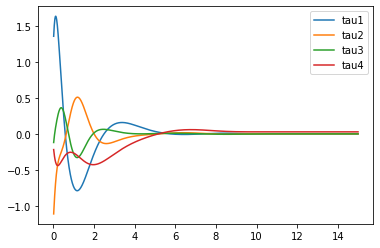

In [35]:
plt.plot(tt[1:1500], ttau1, label="tau1")
plt.plot(tt[1:1500], ttau2, label="tau2")
plt.plot(tt[1:1500], ttau3, label="tau3")
plt.plot(tt[1:1500], ttau4, label="tau4")
plt.legend()

<Figure size 510.236x566.929 with 0 Axes>

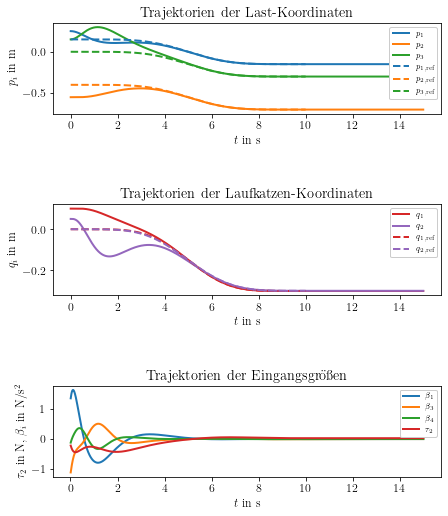

In [36]:
plt.rcParams['text.usetex'] = True  # LaTeX-aktivieren
plt.rcParams['font.size'] = 12
plt.rcParams['legend.fontsize'] = 8
plt.rcParams['figure.subplot.bottom'] = .18
plt.rcParams['figure.subplot.left'] = .20
plt.rcParams['figure.subplot.top'] = .98
plt.rcParams['figure.subplot.right'] = .96
plt.rcParams['font.family'] = 'serif'

# Plot-Größe und Skalierungsfaktor
mm = 1./25.4  # mm to inch
scale = 1
fs = [180*mm*scale, 200*mm*scale]
fig1 = plt.figure(1, figsize=fs)


#plt.rcParams['figure.figsize'] = [25, 20]
fig, axs = plt.subplots(3, 1, figsize=fs)
plt.subplots_adjust(hspace = 1.)

axs[0].plot(tt[:1500], res[:1500, 0], '#1f77b4', label=r'$p_{1}$', linewidth=2.0)
axs[0].plot(tt[:1500], res[:1500, 1], '#ff7f0e', label=r'$p_{2}$', linewidth=2.0)
axs[0].plot(tt[:1500], res[:1500, 2], '#2ca02c', label=r'$p_{3}$', linewidth=2.0)
axs[0].plot(tt[:1000], p1_traj_func(tt[:1000]), '#1f77b4', linestyle='--', label=r'$p_{1,\mathrm{ref}}$', linewidth=2.0)
axs[0].plot(tt[:1000], p2_traj_func(tt[:1000]), '#ff7f0e', linestyle='--', label=r'$p_{2,\mathrm{ref}}$', linewidth=2.0)
axs[0].plot(tt[:1000], p3_traj_func(tt[:1000]), '#2ca02c', linestyle='--', label=r'$p_{3,\mathrm{ref}}$', linewidth=2.0)

axs[0].legend(fancybox=True, framealpha=1.0)
axs[0].set_title('Trajektorien der Last-Koordinaten')
axs[0].set_xlabel(r'$t~\mathrm{in~s}$')
axs[0].set_ylabel('$p_i ~ \mathrm{in~ m}$')

axs[1].plot(tt[:1500], res[:1500, 3], '#d62728', label=r'$q_{1}$', linewidth=2.0)
axs[1].plot(tt[:1500], res[:1500, 4], '#9467bd', label=r'$q_{2}$', linewidth=2.0)
axs[1].plot(tt[:1000], q1_traj_func(tt[:1000]), '#d62728', linestyle='--', label=r'$q_{1,\mathrm{ref}}$', linewidth=2.0)
axs[1].plot(tt[:1000], q2_traj_func(tt[:1000]), '#9467bd', linestyle='--', label=r'$q_{2,\mathrm{ref}}$', linewidth=2.0)

axs[1].legend(fancybox=True, framealpha=1.0)
axs[1].set_title('Trajektorien der Laufkatzen-Koordinaten')
axs[1].set_xlabel(r'$t~\mathrm{in~s}$')
axs[1].set_ylabel('$q_i  ~ \mathrm{in~ m}$')

axs[2].plot(tt[1:1500], ttau1, '#1f77b4', label=r'$\beta_{1}$', linewidth=2.0)
axs[2].plot(tt[1:1500], ttau2, '#ff7f0e', label=r'$\beta_{3}$', linewidth=2.0)
axs[2].plot(tt[1:1500], ttau3, '#2ca02c', label=r'$\beta_{4}$', linewidth=2.0)
axs[2].plot(tt[1:1500], ttau4, '#d62728', label=r'$\tau_{2}$', linewidth=2.0)

axs[2].legend(fancybox=True, framealpha=1.0)
axs[2].set_title('Trajektorien der Eingangsgrößen')
axs[2].set_xlabel(r'$t~\mathrm{in~s}$')
axs[2].set_ylabel(r'$\tau_{2}  ~ \mathrm{in~ N}$, $\beta_{i}  ~ \mathrm{in~ N/}\mathrm{s}^2$')

plt.savefig('dyn_controller_initial_error.pdf', bbox_inches='tight')
plt.show()

### Animation

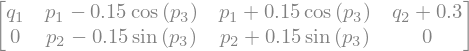

---

In [37]:
joint_pos_expr = st.col_stack(G1, G3, G4, G6).subs(sys_params) ##:
joint_pos_func = st.expr_to_func(mod.tt, joint_pos_expr, keep_shape=True)

In [38]:
res.shape[0]

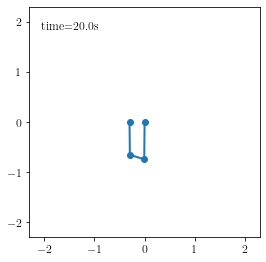

In [39]:
import matplotlib.animation as animation
from IPython.display import HTML

fig = pl.figure() 
ax = fig.add_subplot(111, autoscale_on=False, xlim=(-2.3,2.3), ylim=(-2.3,2.3))
ax.set_aspect('equal')

line, = ax.plot([],[],'o-', lw=2)
time_template = 'time=%.1fs'
time_text = ax.text(0.05, 0.9, '', transform=ax.transAxes)
dt = tt[1] - tt[0]


def init():
    line.set_data([],[])
    time_text.set_text('')
    return line, time_text

l1 =1.0

def animate(i):
    xx, yy = joint_pos_func(*res[i, :(res.shape[1]-6)//2])
    
    line.set_data(xx,yy)
    time_text.set_text(time_template%(i*dt))
    
    return line, time_text


ani = animation.FuncAnimation(fig, animate, range(res.shape[0]), interval=tt[-1]*3, blit=True, init_func=init)


# this animation is nice but results in a big notebook file which is unwanted for publication in the repo
HTML(ani.to_jshtml())

### Oninion Plot

In [40]:
indices1 = npy.linspace(0, 1000, 5, dtype=int)
frame_states1 = res[indices1, :5]

indices2 = npy.linspace(0, 1000, 10, dtype=int)
frame_states2 = res[indices2, :5]

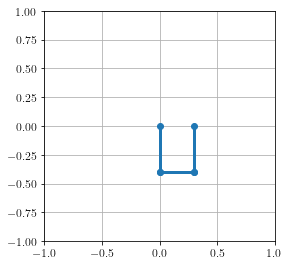

In [41]:
import symbtools.visualisation as vt

vis = vt.Visualiser(ttheta, xlim=(-1, 1), ylim=(-1, 1))
vis.add_linkage([G1.subs(sys_params), G3.subs(sys_params)], color="#1f77b4")
vis.add_linkage([G3.subs(sys_params), G4.subs(sys_params)], color="#1f77b4")
vis.add_linkage([G4.subs(sys_params), G6.subs(sys_params)], color="#1f77b4")
#vis.add_disk([p2.subs(param_subs), p3.subs(param_subs)], color="#ff7f0e", lw=2)

vis.plot(ttheta0)
#vis.interact(theta2=(-3.14, 3.14, 0.01))

<Figure size 396.85x566.929 with 0 Axes>

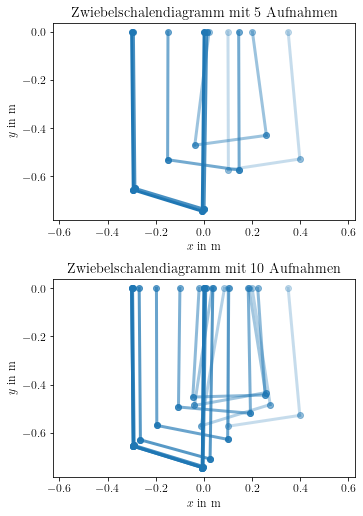

In [44]:
plt.rcParams['text.usetex'] = True  # LaTeX-aktivieren
plt.rcParams['font.size'] = 12
plt.rcParams['legend.fontsize'] = 8
plt.rcParams['figure.subplot.bottom'] = .18
plt.rcParams['figure.subplot.left'] = .20
plt.rcParams['figure.subplot.top'] = .98
plt.rcParams['figure.subplot.right'] = .96
plt.rcParams['font.family'] = 'serif'

# Plot-Größe und Skalierungsfaktor
mm = 1./25.4  # mm to inch
scale = 1
fs = [140*mm*scale, 200*mm*scale]
fig1 = plt.figure(1, figsize=fs)

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=fs);
plt.subplots_adjust(hspace = 0.3)
ax1.axis("equal")
ax1.set_xlim(-1, 1)
ax2.axis("equal")
ax2.set_xlim(-1, 1)

ax1.set_title('Zwiebelschalendiagramm mit 5 Aufnahmen')
ax1.set_xlabel(r'$x ~ \mathrm{in~ m}$')
ax1.set_ylabel('$y ~ \mathrm{in~ m}$')

ax2.set_title('Zwiebelschalendiagramm mit 10 Aufnahmen')
ax2.set_xlabel(r'$x ~ \mathrm{in~ m}$')
ax2.set_ylabel('$y ~ \mathrm{in~ m}$')

vis.plot_onion_skinned(frame_states1, axes=ax1, change_alpha=True, max_lightness=0.75)
vis.plot_onion_skinned(frame_states2, axes=ax2, change_alpha=True, max_lightness=0.75)

plt.savefig('onion_skinned_dynamic.pdf', bbox_inches='tight')